In [1]:
!nvcc --version 

In [3]:
import tensorflow as tf    
import os
import time
import numpy as np
import matplotlib.pyplot as plt
import PIL
from IPython.display import clear_output
import glob
import os
import cv2
from matplotlib import pyplot as plt
import matplotlib.image as mpimg


%matplotlib inline

In [4]:
from tensorflow.python.client import device_lib

print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 733928138929975225
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 16152002560
locality {
  bus_id: 1
  links {
  }
}
incarnation: 14631694835494619515
physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
]


2022-02-08 15:09:26.443410: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-02-08 15:09:26.490907: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:26.597107: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:26.597791: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA 

In [5]:
device = ""

for i in device_lib.list_local_devices():
  if i.name == '/device:GPU:0':
    device = '/device:GPU:0'
    break
  elif i.name == '/device:XLA_GPU:0':
    device = '/device:XLA_GPU:0'

print(device)

/device:GPU:0


2022-02-08 15:09:28.622722: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:28.623447: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:28.624092: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:28.624724: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:28.625361: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [6]:
tf.__version__

'2.6.2'

## Dataset loading

In [7]:
BUFFER_SIZE = 2000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [8]:
def Prepare_dataset(Dataset_dir):
    
    SB_dir = os.path.join(Dataset_dir, 'image/') #Satellite Bilder path
    GT_dir = os.path.join(Dataset_dir, 'label/')# Ground Truths path

    
    SB_listnames=glob.glob(SB_dir+"*.tif")#Satellite Bilder filenames
    GT_listnames=glob.glob(GT_dir+"*_vis.tif")# Ground Truths filenames
   
    SB_listnames.sort(key=lambda x: int("".join([i for i in x if i.isdigit()])))
    GT_listnames.sort(key=lambda x: int("".join([i for i in x if i.isdigit()])))

    
    print("Satellite Directory:",SB_dir)
    print('Anzahl der  Ground Truths:',len(SB_listnames))
    print("") 
    print("Ground Truths Directory:",GT_dir)
    print('Anzahl der satellien Bilder:',len(GT_listnames))

    print("*********************************************") 

    
    return SB_dir,GT_dir,SB_listnames,GT_listnames

In [9]:
def Extract_Contour(image):

    # Load an color image in grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)


    
    kernel = np.ones((2,2),np.uint8)
    erosion = cv2.erode(gray,kernel,iterations = 2)


    blur = cv2.GaussianBlur(erosion, (5, 5), 0)
    (t, maskLayer) = cv2.threshold(blur, 0, 1, cv2.THRESH_BINARY + cv2.THRESH_OTSU)



    kernel = np.ones((2,2),np.uint8)
    dilation = cv2.dilate(maskLayer,kernel,iterations =1)


    blur1 = cv2.GaussianBlur(dilation, (5, 5), 0)
    t, binary = cv2.threshold(blur1, 0, 1,  cv2.THRESH_BINARY+ cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(binary, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE) 

    mask = np.zeros(image.shape, dtype="uint8")
    cv2.drawContours(mask, contours, -1, (0,255,0), 3, cv2.LINE_AA)


    return mask

In [10]:
def Contour_overlay_GT(GT_img,Contour_array):
    
    #ContourOverGT = cv2.bitwise_or(GT_img, Contour_array)
    ContourOverGT=cv2.addWeighted(GT_img,1,Contour_array,1,0)
    #ContourOverSB = cv2.bitwise_or(GT_img, )

    ContourOverGT = cv2.GaussianBlur(ContourOverGT, (5, 5), 0)

    
    return ContourOverGT

In [11]:
def load_image(SB_path,GT_path, is_train,return_name):

      
    SB_path=str(SB_path).split("'")[1]
    SB_img = cv2.imread(SB_path)
    SB_img = cv2.resize(SB_img, dsize=(IMG_HEIGHT,IMG_WIDTH), interpolation=cv2.INTER_CUBIC)
    SB_img= cv2.cvtColor(SB_img,cv2.COLOR_BGR2RGB)
    
    GT_path=str(GT_path).split("'")[1]
    GT_img =cv2.imread(GT_path)
    GT_img = cv2.resize(GT_img, dsize=(IMG_HEIGHT,IMG_WIDTH), interpolation=cv2.INTER_CUBIC)
    GT_img= cv2.cvtColor(GT_img,cv2.COLOR_BGR2RGB)

    Contour=Extract_Contour(GT_img)
    ContourOverGT=Contour_overlay_GT(GT_img,Contour)

    if is_train:        
        if np.random.random() > 0.5:
     # random mirroring
            SB_img = cv2.flip( SB_img, -1);
            ContourOverGT = cv2.flip( ContourOverGT, -1);


    SB_img = (SB_img / 127.5) -1
    ContourOverGT = (ContourOverGT / 127.5) - 1

    SB_img=SB_img.astype("float32")
    ContourOverGT=ContourOverGT.astype("float32")

    if return_name:
            return SB_img,ContourOverGT,GT_path
        


    return SB_img,ContourOverGT

## Data preprocessing

In [12]:
data_path = '../input/resized-aerialimageryforroofsegmentation'

In [13]:
Train_Dataset_dir=f"{data_path}/train/"
Valid_Dataset_dir=f"{data_path}/val/"
Test_Dataset_dir=f"{data_path}/test/"

In [14]:
Train_SB_dir,Train_GT_dir,SB_Train_listnames,GT_Train_listnames=Prepare_dataset(Train_Dataset_dir) #load Satellite und Ground Truths Data
Valid_SB_dir,Valid_GT_dir,SB_Valid_listnames,GT_Valid_listnames=Prepare_dataset(Valid_Dataset_dir)
Test_SB_dir,Test_GT_dir,SB_Test_listnames,GT_Test_listnames=Prepare_dataset(Test_Dataset_dir)

Satellite Directory: ../input/resized-aerialimageryforroofsegmentation/train/image/
Anzahl der  Ground Truths: 857

Ground Truths Directory: ../input/resized-aerialimageryforroofsegmentation/train/label/
Anzahl der satellien Bilder: 857
*********************************************
Satellite Directory: ../input/resized-aerialimageryforroofsegmentation/val/image/
Anzahl der  Ground Truths: 94

Ground Truths Directory: ../input/resized-aerialimageryforroofsegmentation/val/label/
Anzahl der satellien Bilder: 94
*********************************************
Satellite Directory: ../input/resized-aerialimageryforroofsegmentation/test/image/
Anzahl der  Ground Truths: 95

Ground Truths Directory: ../input/resized-aerialimageryforroofsegmentation/test/label/
Anzahl der satellien Bilder: 95
*********************************************


In [15]:
for i in range(5):
    print(SB_Train_listnames[i],GT_Train_listnames[i])
    print("")

../input/resized-aerialimageryforroofsegmentation/train/image/christchurch_9.tif ../input/resized-aerialimageryforroofsegmentation/train/label/christchurch_9_vis.tif

../input/resized-aerialimageryforroofsegmentation/train/image/christchurch_10.tif ../input/resized-aerialimageryforroofsegmentation/train/label/christchurch_10_vis.tif

../input/resized-aerialimageryforroofsegmentation/train/image/christchurch_11.tif ../input/resized-aerialimageryforroofsegmentation/train/label/christchurch_11_vis.tif

../input/resized-aerialimageryforroofsegmentation/train/image/christchurch_12.tif ../input/resized-aerialimageryforroofsegmentation/train/label/christchurch_12_vis.tif

../input/resized-aerialimageryforroofsegmentation/train/image/christchurch_13.tif ../input/resized-aerialimageryforroofsegmentation/train/label/christchurch_13_vis.tif



In [16]:
SB_dataset_train = tf.data.Dataset.from_tensor_slices(SB_Train_listnames)
GT_dataset_train = tf.data.Dataset.from_tensor_slices(GT_Train_listnames)
train_dataset=tf.data.Dataset.zip((SB_dataset_train,GT_dataset_train))
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.map(lambda x,y: tf.numpy_function(load_image, [x, y,True,False], [tf.float32,tf.float32]),num_parallel_calls=4)
train_dataset = train_dataset.batch(1)

2022-02-08 15:09:29.047192: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:29.047992: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:29.048598: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:29.049513: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-08 15:09:29.050187: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from S

In [17]:
SB_dataset_valid = tf.data.Dataset.from_tensor_slices(SB_Valid_listnames)
GT_dataset_valid = tf.data.Dataset.from_tensor_slices(GT_Valid_listnames)
valid_dataset=tf.data.Dataset.zip((SB_dataset_valid,GT_dataset_valid))
valid_dataset = valid_dataset.shuffle(BUFFER_SIZE)
valid_dataset = valid_dataset.map(lambda x, y: tf.numpy_function(load_image, [x, y,True,False], [tf.float32,tf.float32]), num_parallel_calls=4)
valid_dataset = valid_dataset.batch(1)

In [18]:
SB_dataset_test = tf.data.Dataset.from_tensor_slices(SB_Test_listnames)
GT_dataset_test = tf.data.Dataset.from_tensor_slices(GT_Test_listnames)
test_dataset=tf.data.Dataset.zip((SB_dataset_test,GT_dataset_test))
test_dataset = test_dataset.shuffle(BUFFER_SIZE)
test_dataset = test_dataset.map(lambda x, y: tf.numpy_function(load_image, [x, y,False,True], [tf.float32,tf.float32,tf.string]), num_parallel_calls=4)
test_dataset = test_dataset.batch(1)

2022-02-08 15:09:29.529051: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


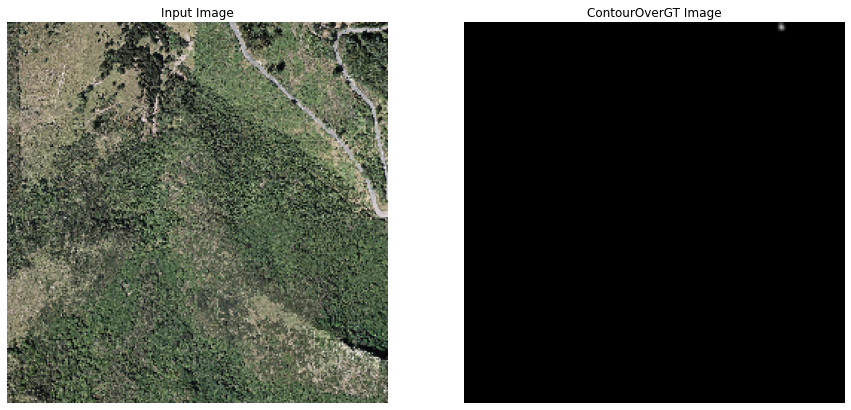

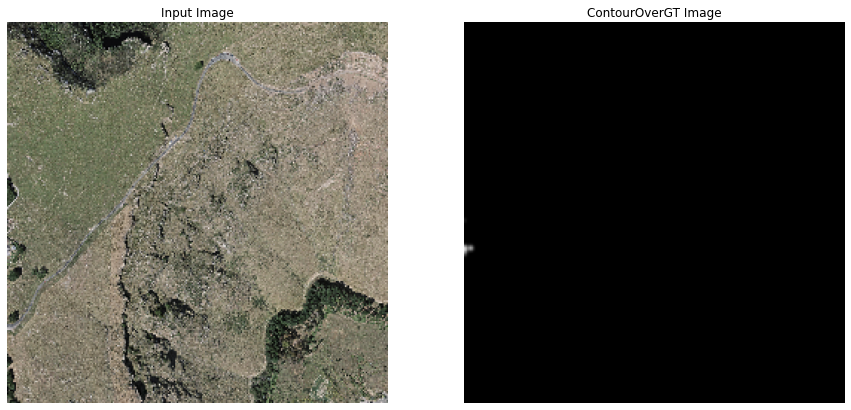

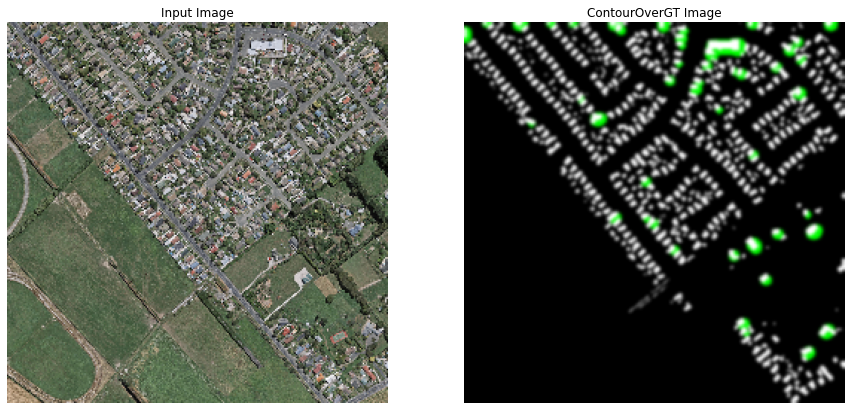

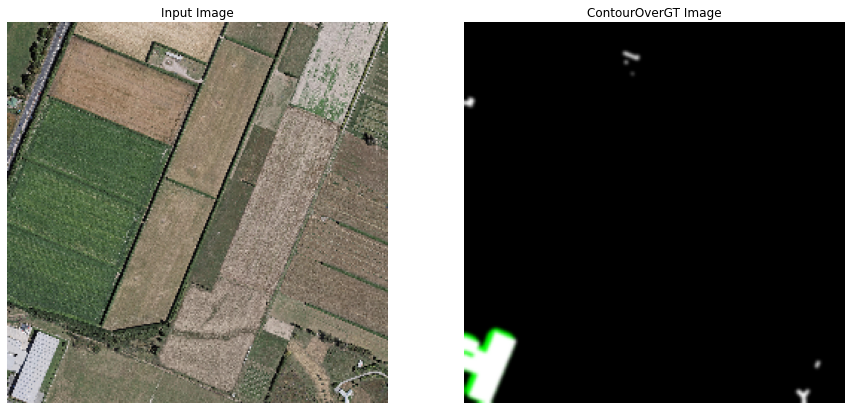

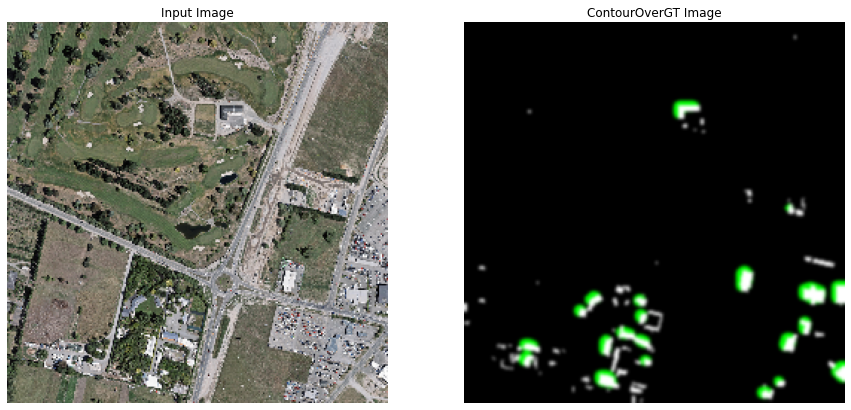

In [19]:

for SB, ContourOverGT in train_dataset.take(5):
    plt.figure(figsize=(15,15))
    display_list=[SB[0,:,:,:],ContourOverGT[0,:,:,:]]
    title = ['Input Image', 'ContourOverGT Image']
    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i]*.5+.5 )
        plt.axis('off')
    plt.show()

## Generator and Discriminator models (GAN Model)

In [20]:
OUTPUT_CHANNELS = 3

In [21]:
class Downsample(tf.keras.Model):
    def __init__(self, filters, size, apply_batchnorm=True):
        super(Downsample, self).__init__()
        self.apply_batchnorm = apply_batchnorm
        initializer = tf.random_normal_initializer(0., 0.02)

        self.conv1 = tf.keras.layers.Conv2D(filters, 
                                        (size, size), 
                                        strides=2, 
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm = tf.keras.layers.BatchNormalization()
  
    def call(self, x, training):
        x = self.conv1(x)
        if self.apply_batchnorm:
            x = self.batchnorm(x, training=training)
        x = tf.nn.leaky_relu(x)
        return x 


class Upsample(tf.keras.Model):
    def __init__(self, filters, size, apply_dropout=False):
        super(Upsample, self).__init__()
        self.apply_dropout = apply_dropout
        initializer = tf.random_normal_initializer(0., 0.02)

        self.up_conv = tf.keras.layers.Conv2DTranspose(filters, 
                                                   (size, size), 
                                                   strides=2, 
                                                   padding='same',
                                                   kernel_initializer=initializer,
                                                   use_bias=False)
        self.batchnorm = tf.keras.layers.BatchNormalization()
        if self.apply_dropout:            
            self.dropout = tf.keras.layers.Dropout(0.5)

    def call(self, x1, x2, training):
        x = self.up_conv(x1)
        x = self.batchnorm(x, training=training)
        if self.apply_dropout:
            x = self.dropout(x, training=training)
        x = tf.nn.relu(x)
        x = tf.concat([x, x2], axis=-1)
        return x


class Generator(tf.keras.Model):
    def __init__(self):
        super(Generator, self).__init__()
        initializer = tf.random_normal_initializer(0., 0.02)
    
        self.down1 = Downsample(64, 4, apply_batchnorm=False)
        self.down2 = Downsample(128, 4)
        self.down3 = Downsample(256, 4)
        self.down4 = Downsample(512, 4)
        self.down5 = Downsample(512, 4)
        self.down6 = Downsample(512, 4)
        self.down7 = Downsample(512, 4)
        self.down8 = Downsample(512, 4)

        self.up1 = Upsample(512, 4, apply_dropout=True)
        self.up2 = Upsample(512, 4, apply_dropout=True)
        self.up3 = Upsample(512, 4, apply_dropout=True)
        self.up4 = Upsample(512, 4)
        self.up5 = Upsample(256, 4)
        self.up6 = Upsample(128, 4)
        self.up7 = Upsample(64, 4)

        self.last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 
                                                (4, 4), 
                                                strides=2, 
                                                padding='same',
                                                kernel_initializer=initializer)
  
    def call(self, x, training):
        # x shape == (bs, 256, 256, 3)    
        x1 = self.down1(x, training=training) # (bs, 128, 128, 64)
        x2 = self.down2(x1, training=training) # (bs, 64, 64, 128)
        x3 = self.down3(x2, training=training) # (bs, 32, 32, 256)
        x4 = self.down4(x3, training=training) # (bs, 16, 16, 512)
        x5 = self.down5(x4, training=training) # (bs, 8, 8, 512)
        x6 = self.down6(x5, training=training) # (bs, 4, 4, 512)
        x7 = self.down7(x6, training=training) # (bs, 2, 2, 512)
        x8 = self.down8(x7, training=training) # (bs, 1, 1, 512)

        x9 = self.up1(x8, x7, training=training) # (bs, 2, 2, 1024)
        x10 = self.up2(x9, x6, training=training) # (bs, 4, 4, 1024)
        x11 = self.up3(x10, x5, training=training) # (bs, 8, 8, 1024)
        x12 = self.up4(x11, x4, training=training) # (bs, 16, 16, 1024)
        x13 = self.up5(x12, x3, training=training) # (bs, 32, 32, 512)
        x14 = self.up6(x13, x2, training=training) # (bs, 64, 64, 256)
        x15 = self.up7(x14, x1, training=training) # (bs, 128, 128, 128)

        x16 = self.last(x15) # (bs, 256, 256, 3)
        x16 = tf.nn.tanh(x16)

        return x16

In [22]:
class DiscDownsample(tf.keras.Model):
    def __init__(self, filters, size, apply_batchnorm=True):
        super(DiscDownsample, self).__init__()
        self.apply_batchnorm = apply_batchnorm
        initializer = tf.random_normal_initializer(0., 0.02)

        self.conv1 = tf.keras.layers.Conv2D(filters, 
                                        (size, size), 
                                        strides=2, 
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm = tf.keras.layers.BatchNormalization()
  
    def call(self, x, training):
        x = self.conv1(x)
        if self.apply_batchnorm:
            x = self.batchnorm(x, training=training)
        x = tf.nn.leaky_relu(x)
        return x 

class Discriminator(tf.keras.Model):
    
    def __init__(self):
        super(Discriminator, self).__init__()
        initializer = tf.random_normal_initializer(0., 0.02)
    
        self.down1 = DiscDownsample(64, 4, False)
        self.down2 = DiscDownsample(128, 4)
        self.down3 = DiscDownsample(256, 4)
    
    # we are zero padding here with 1 because we need our shape to 
    # go from (batch_size, 32, 32, 256) to (batch_size, 31, 31, 512)
        self.zero_pad1 = tf.keras.layers.ZeroPadding2D()
        self.conv = tf.keras.layers.Conv2D(512, 
                                       (4, 4), 
                                       strides=1, 
                                       kernel_initializer=initializer, 
                                       use_bias=False)
        self.batchnorm1 = tf.keras.layers.BatchNormalization()
    
    # shape change from (batch_size, 31, 31, 512) to (batch_size, 30, 30, 1)
        self.zero_pad2 = tf.keras.layers.ZeroPadding2D()
        self.last = tf.keras.layers.Conv2D(1, 
                                       (4, 4), 
                                       strides=1,
                                       kernel_initializer=initializer)
  
    def call(self, inp, tar, training):
        # concatenating the input and the target
        x = tf.concat([inp, tar], axis=-1) # (bs, 256, 256, channels*2)
        x = self.down1(x, training=training) # (bs, 128, 128, 64)
        x = self.down2(x, training=training) # (bs, 64, 64, 128)
        x = self.down3(x, training=training) # (bs, 32, 32, 256)

        x = self.zero_pad1(x) # (bs, 34, 34, 256)
        x = self.conv(x)      # (bs, 31, 31, 512)
        x = self.batchnorm1(x, training=training)
        x = tf.nn.leaky_relu(x)
    
        x = self.zero_pad2(x) # (bs, 33, 33, 512)
        # don't add a sigmoid activation here since
        # the loss function expects raw logits.
        x = self.last(x)      # (bs, cen, 30, 1 )

        return x

In [23]:
generator = Generator()
discriminator = Discriminator()

## Defining loss functions and optimizers

In [24]:
LAMBDA = 100

In [25]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = tf.compat.v1.losses.sigmoid_cross_entropy(multi_class_labels = tf.ones_like(disc_real_output), logits = disc_real_output)
    generated_loss = tf.compat.v1.losses.sigmoid_cross_entropy(multi_class_labels = tf.zeros_like(disc_generated_output), logits = disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [26]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = tf.compat.v1.losses.sigmoid_cross_entropy(multi_class_labels = tf.ones_like(disc_generated_output), logits = disc_generated_output) 
  # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss

In [27]:
generator_optimizer = tf.optimizers.Adam(beta_1=0.5, epsilon=2e-4)
discriminator_optimizer = tf.optimizers.Adam(beta_1=0.5, epsilon=2e-4)

## Saving model checkpoints

In [28]:
! mkdir ./checkpoint
! mkdir ./checkpoint/originalPix2Pix_C_overlay_G

In [29]:
checkpoint_dir = './checkpoint'
checkpoint_prefix = os.path.join(checkpoint_dir, "originalPix2Pix_C_overlay_G/")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [30]:
checkpoint_prefix

'./checkpoint/originalPix2Pix_C_overlay_G/'

## Model Training (Images Generating)

In [31]:
EPOCHS = 50

In [32]:
def generate_images(model, test_input, tar, save, address=None):

    global name
  
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    if save:
        name=str(name).split("'")[1].split("/")[-1] 
        plt.savefig(address+str(name))
    plt.show()

In [33]:
losses = []

def train(dataset, epochs):
    with tf.device(device):
        
      cpt=1
      cpt2=27
        
      for epoch in range(epochs):
            start = time.time()

            for input_image, target in dataset:
                with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
                    gen_output = generator(input_image, training=True)

                    disc_real_output = discriminator(input_image, target, training=True)
                    disc_generated_output = discriminator(input_image, gen_output, training=True)

                    gen_loss = generator_loss(disc_generated_output, gen_output, target)
                    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
                    #losses.append(zip(gen_loss, disc_loss))
                    losses.append((gen_loss, disc_loss))

                generator_gradients = gen_tape.gradient(gen_loss, generator.variables)
                discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.variables)

                generator_optimizer.apply_gradients(zip(generator_gradients, 
                                                generator.variables))
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, 
                                                    discriminator.variables))

            if epoch % 1 == 0:
                clear_output(wait=True)
                for inp, tar in valid_dataset.take(15):
                    generate_images(generator, inp, tar, save=False)

      # saving (checkpoint) the model every 10 epochs
            if (epoch + 1) % 1 == 0:
                checkpoint.save(file_prefix = checkpoint_prefix)

            print(f'Time taken for epoch {epoch + 1} is {time.time()-start} sec\n')
            
            if (epoch+1) % 29 == 0:
                for i in range(cpt, cpt2):
                    ! rm ./checkpoint/originalPix2Pix_C_overlay_G/-{i}.data-00000-of-00001
                cpt+=27
                cpt2+=27

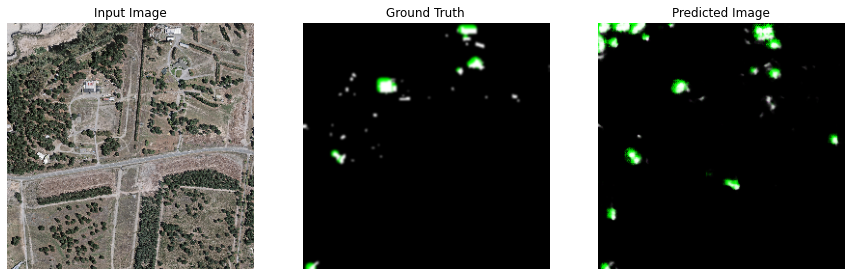

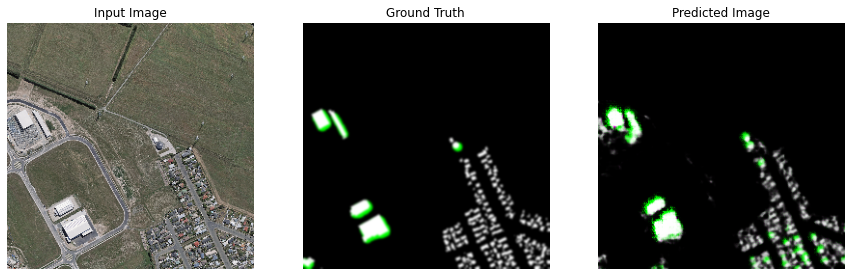

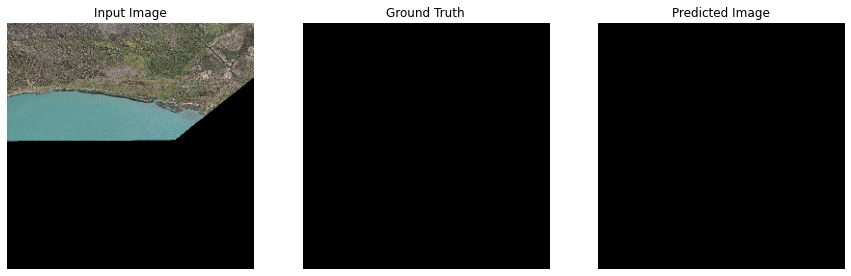

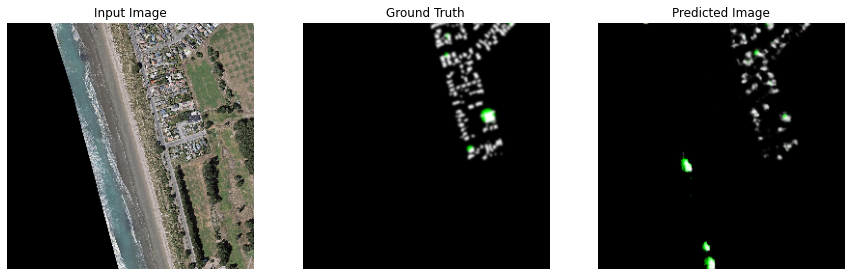

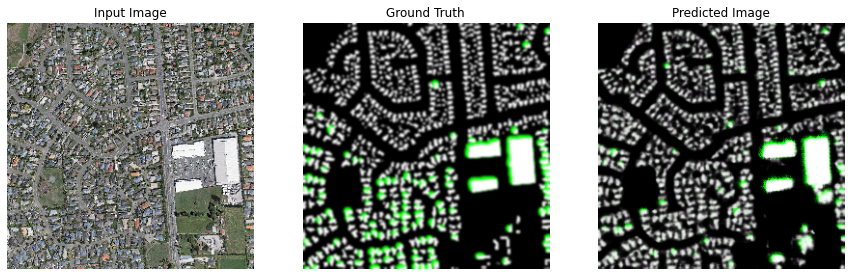

...

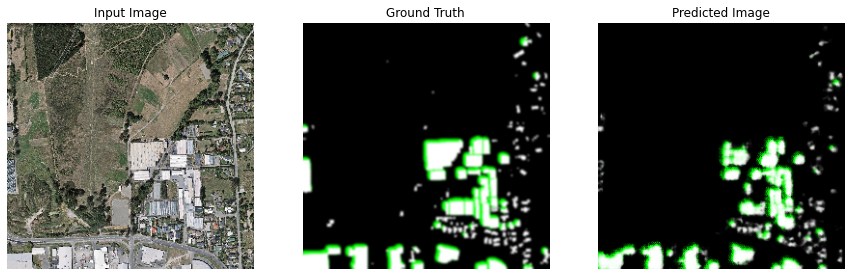

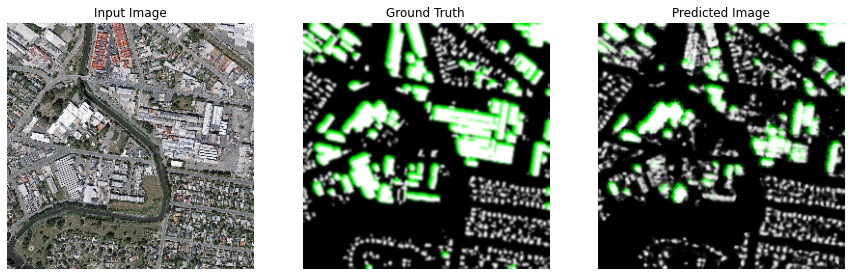

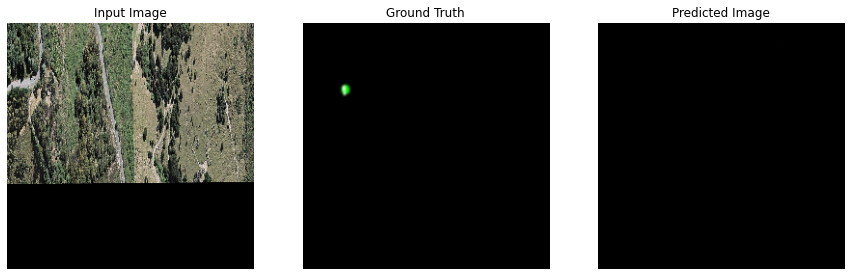

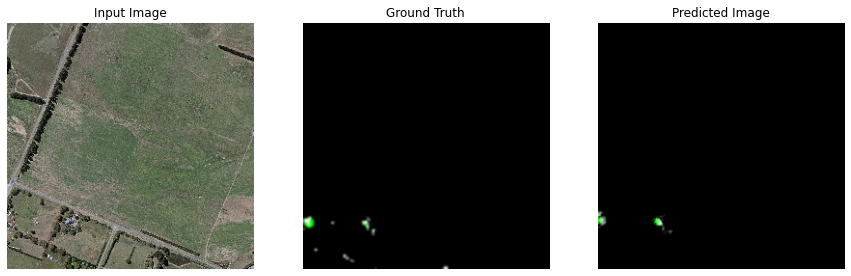

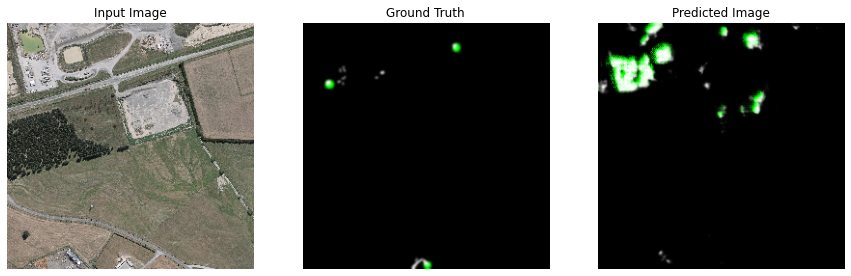

Time taken for epoch 50 is 148.50523686408997 sec



In [34]:
train(train_dataset, EPOCHS)

## Model Evaluation

In [60]:
generator.summary()

Model: "generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
downsample (Downsample)      multiple                  3072      
_________________________________________________________________
downsample_1 (Downsample)    multiple                  131584    
_________________________________________________________________
downsample_2 (Downsample)    multiple                  525312    
_________________________________________________________________
downsample_3 (Downsample)    multiple                  2099200   
_________________________________________________________________
downsample_4 (Downsample)    multiple                  4196352   
_________________________________________________________________
downsample_5 (Downsample)    multiple                  4196352   
_________________________________________________________________
downsample_6 (Downsample)    multiple                  41

In [61]:
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
disc_downsample (DiscDownsam multiple                  6144      
_________________________________________________________________
disc_downsample_1 (DiscDowns multiple                  131584    
_________________________________________________________________
disc_downsample_2 (DiscDowns multiple                  525312    
_________________________________________________________________
zero_padding2d (ZeroPadding2 multiple                  0         
_________________________________________________________________
conv2d_11 (Conv2D)           multiple                  2097152   
_________________________________________________________________
batch_normalization_16 (Batc multiple                  2048      
_________________________________________________________________
zero_padding2d_1 (ZeroPaddin multiple                

In [51]:
(G_loss_list, D_loss_list) = [], []

for i in losses:
    G_loss_list.append(i[0])
    D_loss_list.append(i[1])

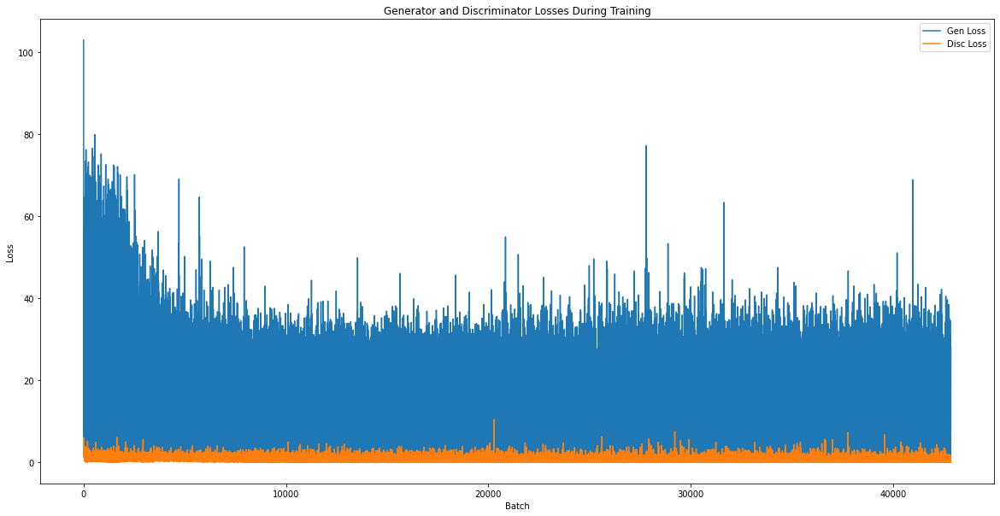

In [52]:
plt.figure(figsize=(20,10))
plt.title("Generator and Discriminator Losses During Training")
plt.plot(G_loss_list,label="Gen Loss")
plt.plot(D_loss_list,label="Disc Loss")
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Testing on the Test Dataset

In [53]:
# restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint('./checkpoint/originalPix2Pix_C_overlay_G/'))

In [54]:
! mkdir ./checkpoint/originalPix2Pix_C_overlay_G_Test

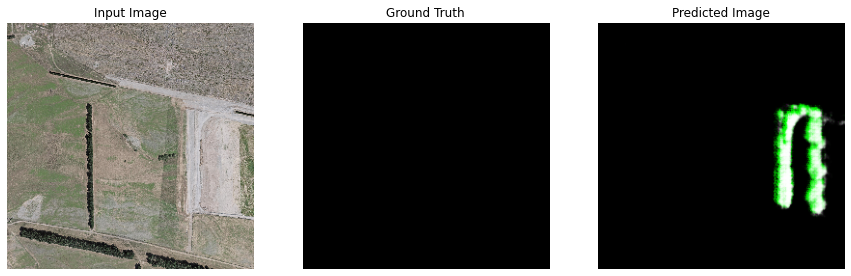

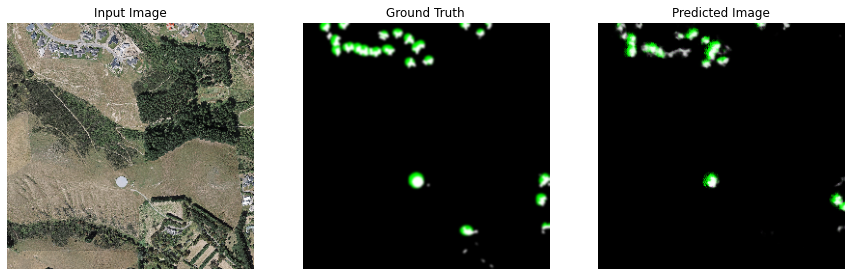

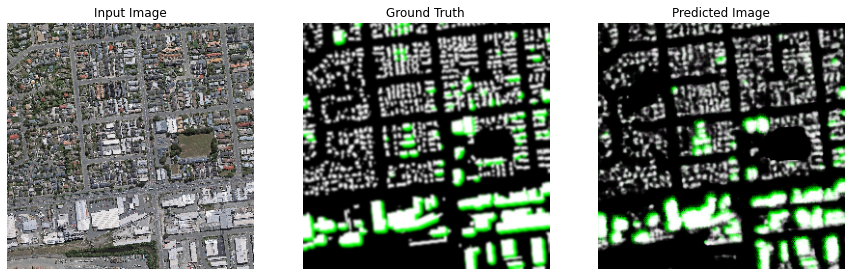

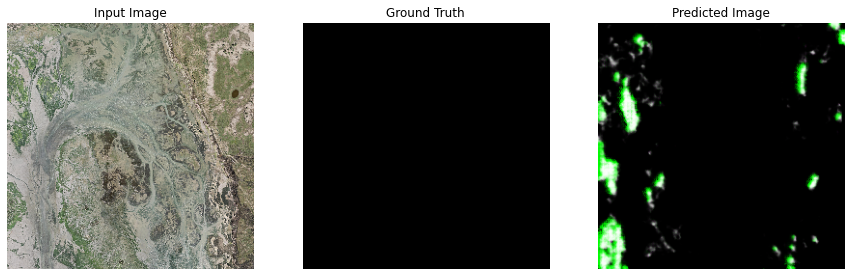

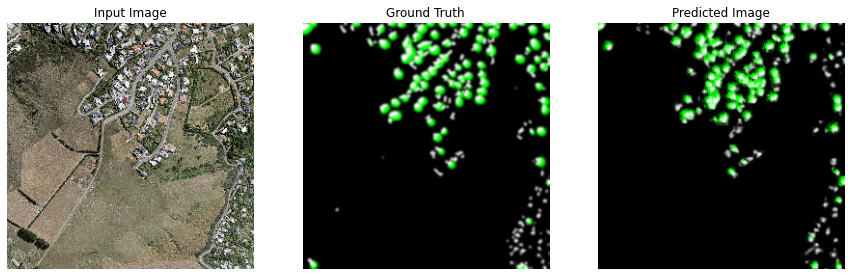

...

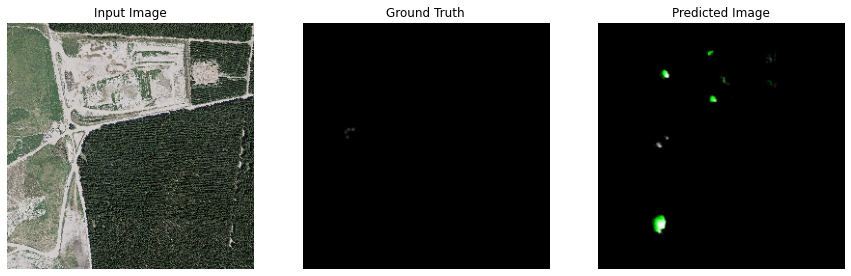

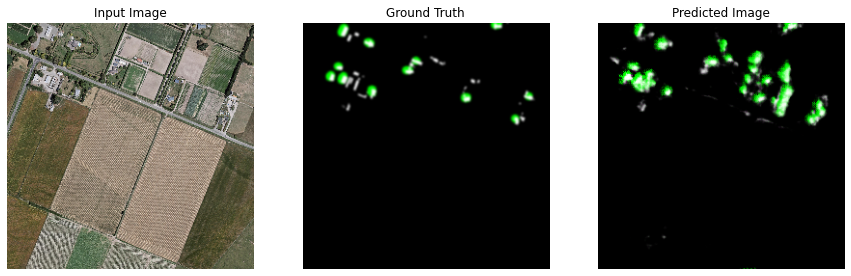

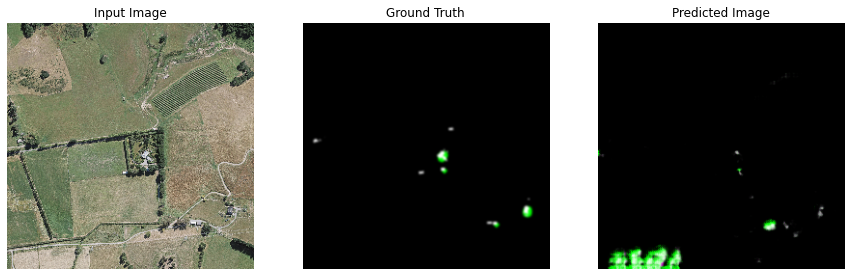

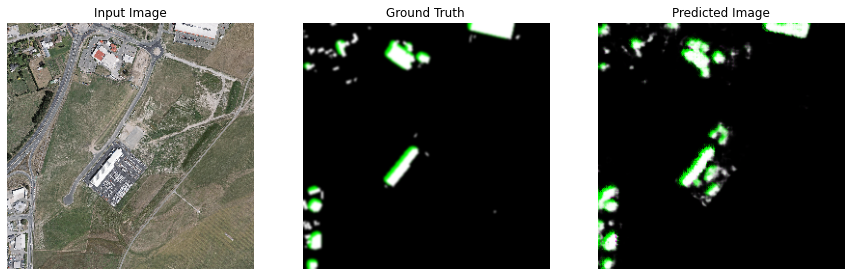

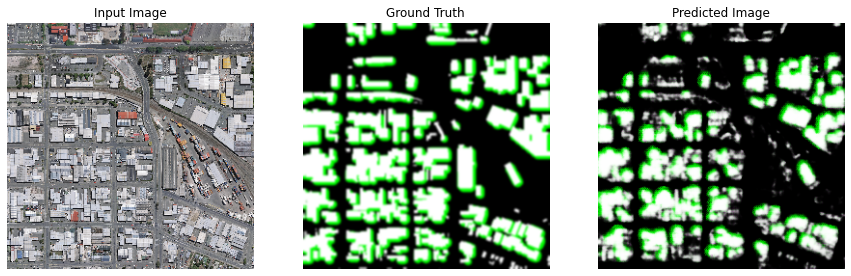

In [55]:
# Run the trained model on 12 inputs of test dataset 
name=0
address='./checkpoint/originalPix2Pix_C_overlay_G_Test'
for inp, tar in train_dataset.take(12):
    generate_images(generator, inp, tar,False,address)

In [ ]:
# Run the trained model on the entire test dataset 

address='./checkpoint/originalPix2Pix_C_overlay_G_Test'

for inp, tar, name in test_dataset.take(95):
    generate_images(generator, inp, tar, False, address)